<a href="https://colab.research.google.com/github/ZatoCreW/masterthesis/blob/main/MasterThesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Loading

In [1]:
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
import numpy as np
import math

In [2]:
!wget "https://opendata-ajuntament.barcelona.cat/data/dataset/4a469cf6-dbab-4aa1-b492-aa0af9af93c9/resource/9c507837-598a-4433-b027-a9aa5138f1f7/download" -O usage_bicing.csv
!wget "https://opendata-ajuntament.barcelona.cat/data/dataset/fa94d2f3-3428-47b8-9f2b-f1e4423e745a/resource/bad49339-2083-4e66-8d2c-b8daafa8e3d6/download" -O stations_bicing.csv

--2022-09-08 14:30:52--  https://opendata-ajuntament.barcelona.cat/data/dataset/4a469cf6-dbab-4aa1-b492-aa0af9af93c9/resource/9c507837-598a-4433-b027-a9aa5138f1f7/download
Resolving opendata-ajuntament.barcelona.cat (opendata-ajuntament.barcelona.cat)... 52.169.230.63
Connecting to opendata-ajuntament.barcelona.cat (opendata-ajuntament.barcelona.cat)|52.169.230.63|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://opendata-ajuntament.barcelona.cat/resources/bcn/BicingUS/2018_10_Octubre_BICING_US.csv [following]
--2022-09-08 14:30:53--  https://opendata-ajuntament.barcelona.cat/resources/bcn/BicingUS/2018_10_Octubre_BICING_US.csv
Reusing existing connection to opendata-ajuntament.barcelona.cat:443.
HTTP request sent, awaiting response... 200 OK
Length: 189605 (185K) [text/csv]
Saving to: ‘usage_bicing.csv’

usage_bicing.csv    100%[===================>] 185.16K   268KB/s    in 0.7s    

2022-09-08 14:30:54 (268 KB/s) - ‘usage_bicing.csv’ saved [189605

## Usage Dataset

Dataset columns: faulty record (binary), total number of bikes in use at time t, electrical bikes in use, mechanical bikes in use, timestamp t.

In [3]:
df_usage = pd.read_csv('usage_bicing.csv')
df_usage.head()

,error,bikesInUsage,electricalBikesInUsage,mechanicalBikesInUsage,dateTime
0,0,577,10,567,2018-10-01 09:33:52
1,0,490,2,488,2018-10-01 12:20:06
2,0,607,5,602,2018-10-01 14:03:19
3,0,620,7,613,2018-10-01 15:05:20
4,0,657,11,646,2018-10-01 15:16:20


In [4]:
len(df_usage[df_usage['error']==1])

0

In [5]:
dpl = df_usage.duplicated()
print(f'df_usage has {len(df_usage)} records \n')
print(f'Number of duplciated records in df_usage: {dpl.sum()} \n')
print('Number of null records: ')
print(df_usage.isnull().sum())

df_usage has 5630 records 

Number of duplciated records in df_usage: 0 

Number of null records: 
error                     0
bikesInUsage              0
electricalBikesInUsage    0
mechanicalBikesInUsage    0
dateTime                  0
dtype: int64


In [6]:
df_usage['dateTime'] = pd.to_datetime(df_usage['dateTime'])
df_usage['dow'] = [df_usage['dateTime'][i].weekday() for i in range(len(df_usage))]
df_usage['time'] = df_usage['dateTime'].dt.time
df_usage['hour'] = df_usage['dateTime'].dt.hour

In [7]:
df_usage

,error,bikesInUsage,electricalBikesInUsage,mechanicalBikesInUsage,dateTime,dow,time,hour
0,0,577,10,567,2018-10-01 09:33:52,0,09:33:52,9
1,0,490,2,488,2018-10-01 12:20:06,0,12:20:06,12
2,0,607,5,602,2018-10-01 14:03:19,0,14:03:19,14
3,0,620,7,613,2018-10-01 15:05:20,0,15:05:20,15
4,0,657,11,646,2018-10-01 15:16:20,0,15:16:20,15
...,...,...,...,...,...,...,...,...
5625,0,192,2,190,2018-10-31 23:36:38,2,23:36:38,23
5626,0,195,2,193,2018-10-31 23:41:38,2,23:41:38,23
5627,0,156,1,155,2018-10-31 23:46:37,2,23:46:37,23
5628,0,139,0,139,2018-10-31 23:51:37,2,23:51:37,23


## Stations Dataset

In [8]:
df_stations = pd.read_csv('stations_bicing.csv')
df_stations.head()

,id,type,latitude,longitude,streetName,streetNumber,altitude,slots,bikes,nearbyStations,status,updateTime
0,1,BIKE,41.397952,2.180042,Gran Via Corts Catalanes,760,21,28,1,"24, 369, 387, 426",OPN,01/10/18 09:33:08
1,2,BIKE,41.395530,2.177060,Roger de Flor/ Gran Vía,126,21,16,11,"360, 368, 387, 414",OPN,01/10/18 09:33:08
2,3,BIKE,41.394072,2.183441,Nàpols,82,22,18,8,"4, 6, 119, 419",OPN,01/10/18 09:33:08
3,4,BIKE,41.393470,2.181490,Ribes,13,21,17,3,"3, 5, 359, 419",OPN,01/10/18 09:33:08
4,5,BIKE,41.391075,2.180223,Pg Lluís Companys,11,16,32,6,"6, 7, 359, 418",OPN,01/10/18 09:33:08


In [9]:
dpl = df_stations.duplicated()
print(f'df_stations has {len(df_stations)} records \n')
print(f'Number of duplciated records in df_stations: {dpl.sum()} \n')
print('Number of null records: ')
print(df_stations.isnull().sum())

df_stations has 2606250 records 

Number of duplciated records in df_stations: 1852 

Number of null records: 
id                     0
type                   0
latitude               0
longitude              0
streetName             0
streetNumber      206320
altitude               0
slots                  0
bikes                  0
nearbyStations         0
status                 0
updateTime             0
dtype: int64


In [10]:
df_stations.loc[df_stations.duplicated(keep=False), :]

,id,type,latitude,longitude,streetName,streetNumber,altitude,slots,bikes,nearbyStations,status,updateTime
2327987,1,BIKE,41.397952,2.180042,Gran Via Corts Catalanes,760,21,9,19,"24, 369, 387, 426",OPN,29/10/18 21:45:35
2327988,2,BIKE,41.395530,2.177060,Roger de Flor/ Gran Vía,126,21,1,22,"360, 368, 387, 414",OPN,29/10/18 21:45:35
2327989,3,BIKE,41.394055,2.181299,Nàpols,82,22,13,11,"4, 6, 119, 419",OPN,29/10/18 21:45:35
2327990,4,BIKE,41.393480,2.181555,Ribes,13,21,4,17,"3, 5, 359, 419",OPN,29/10/18 21:45:35
2327991,5,BIKE,41.391075,2.180223,Pg Lluís Companys,11,16,33,3,"6, 7, 359, 418",OPN,29/10/18 21:45:35
...,...,...,...,...,...,...,...,...,...,...,...,...
2341872,492,BIKE-ELECTRIC,41.394232,2.175278,PL. DE TETUAN,8-9,21,10,12,"459, 485",OPN,30/10/18 00:12:28
2341873,493,BIKE-ELECTRIC,41.381860,2.177086,PL. SANT MIQUEL,4,8,12,10,"460, 477",OPN,30/10/18 00:12:28
2341874,494,BIKE-ELECTRIC,41.389481,2.165357,RAMBLA CATALUNYA,31,41,13,11,"484, 485",OPN,30/10/18 00:12:28
2341875,495,BIKE-ELECTRIC,41.377191,2.149283,C/ DIPUTACIÓ - TARRAGONA,SN,45,10,14,"451, 481",OPN,30/10/18 00:12:28


In [11]:
df_stations.drop_duplicates(inplace=True)

In [12]:
df_stations['updateTime'] = pd.to_datetime(df_stations['updateTime'], format='%d/%m/%y %H:%M:%S')
df_stations = df_stations[df_stations['updateTime'].dt.month==10]
df_stations['dow'] = df_stations['updateTime'].dt.weekday
df_stations['capacity'] = df_stations['bikes'] + df_stations['slots']
df_stations['rel_bikes'] = df_stations['bikes']/df_stations['capacity']
df_stations['rel_slots'] = df_stations['slots']/df_stations['capacity']
df_stations['time'] = df_stations['updateTime'].dt.time
df_stations['hour'] = df_stations['updateTime'].dt.hour
df_stations['day'] = df_stations['updateTime'].dt.day

In [13]:
df_open = df_stations[df_stations['status']=='OPN']

In [14]:
incomplete_nodes = list()

for id in df_open['id'].unique():
  node = df_open[df_open['id']==id]
  if len(node) < 288:
    incomplete_nodes.append(id)

In [15]:
incomplete_nodes

[222]

In [16]:
df_open = df_open[df_open['id']!=222]

In [17]:
df_open.head()

,id,type,latitude,longitude,streetName,streetNumber,altitude,slots,bikes,nearbyStations,status,updateTime,dow,capacity,rel_bikes,rel_slots,time,hour,day
0,1,BIKE,41.397952,2.180042,Gran Via Corts Catalanes,760,21,28,1,"24, 369, 387, 426",OPN,2018-10-01 09:33:08,0,29,0.034483,0.965517,09:33:08,9,1
1,2,BIKE,41.395530,2.177060,Roger de Flor/ Gran Vía,126,21,16,11,"360, 368, 387, 414",OPN,2018-10-01 09:33:08,0,27,0.407407,0.592593,09:33:08,9,1
2,3,BIKE,41.394072,2.183441,Nàpols,82,22,18,8,"4, 6, 119, 419",OPN,2018-10-01 09:33:08,0,26,0.307692,0.692308,09:33:08,9,1
3,4,BIKE,41.393470,2.181490,Ribes,13,21,17,3,"3, 5, 359, 419",OPN,2018-10-01 09:33:08,0,20,0.150000,0.850000,09:33:08,9,1
4,5,BIKE,41.391075,2.180223,Pg Lluís Companys,11,16,32,6,"6, 7, 359, 418",OPN,2018-10-01 09:33:08,0,38,0.157895,0.842105,09:33:08,9,1


In [18]:
len(df_stations)

2603935

In [19]:
len(df_open)

2570159

In [20]:
df_stations['id'].nunique()

463

In [21]:
df_open['id'].nunique()

459

# EDA

In [22]:
df_usage.head()

,error,bikesInUsage,electricalBikesInUsage,mechanicalBikesInUsage,dateTime,dow,time,hour
0,0,577,10,567,2018-10-01 09:33:52,0,09:33:52,9
1,0,490,2,488,2018-10-01 12:20:06,0,12:20:06,12
2,0,607,5,602,2018-10-01 14:03:19,0,14:03:19,14
3,0,620,7,613,2018-10-01 15:05:20,0,15:05:20,15
4,0,657,11,646,2018-10-01 15:16:20,0,15:16:20,15


In [23]:
temp = df_usage.groupby('time').agg({'bikesInUsage': np.mean}).reset_index()
fig = px.line(temp, y='bikesInUsage', x='time')
fig.show()

In [24]:
print(f'''Maximum number of bikes simultaneously being used: {max(df_usage['bikesInUsage'])}
Minimum number of bikes simultaneously being used: {min(df_usage['bikesInUsage'])}''')

Maximum number of bikes simultaneously being used: 1199
Minimum number of bikes simultaneously being used: 6


In [25]:
temp = df_usage.groupby(['dow', 'hour']).agg({'bikesInUsage': np.mean}).reset_index()
fig = px.line(temp, y='bikesInUsage', x='hour', color='dow')
fig.show()

In [26]:
!pip install dash
!pip install jupyter_dash

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [27]:
from dash import Dash, dcc, html, Input, Output
from jupyter_dash import JupyterDash

In [28]:
px.set_mapbox_access_token('pk.eyJ1IjoiemF0b2NyZXciLCJhIjoiY2w1czIzZnR3MDM0aTNjcDNuZ2Z4eXR5ZiJ9.wYv8dtoyNe_V7Koj1Efzag')

In [29]:
app = JupyterDash(__name__)

app.layout = html.Div([
                       
    html.H1('Number of bikes in station', style={'color': 'white', 'text-align': 'center'}),
    dcc.Slider(min=0, max=df_open['time'].nunique(), value=0, id='t_slider'),
    html.Div(id='slider_output_container', children=[], style={'color':'white'}),
    html.Br(),
    dcc.Graph(id='station_map', figure={})
])

@app.callback(
    [Output(component_id='slider_output_container', component_property='children'),
     Output(component_id='station_map', component_property='figure')],
    [Input(component_id='t_slider', component_property='value')]
)

def update_graph(selected_t):
  print(selected_t)
  value_to_t = {k: v for k, v in zip(range(df_open['time'].nunique()),
                                     [t for t in df_open['time'].unique()])}
  container = ('Time frame selected: {}'.format(value_to_t[selected_t]))

  snapshot = df_open[df_open['time']==value_to_t[selected_t]]

  fig = px.scatter_mapbox(snapshot, 
                          lat="latitude", 
                          lon="longitude", 
                          size="rel_bikes", 
                          zoom=13)
  return container, fig

In [30]:
app.run_server(mode='inline')

<IPython.core.display.Javascript object>

Dash stopped working for some reason

In [31]:
snapshot = df_stations[df_stations['time']==df_stations['time'].reset_index(drop=True)[0]]

In [32]:
fig = px.scatter_mapbox(snapshot, lat="latitude", lon="longitude", color="capacity", zoom=11, hover_data=['id'])
fig.show()

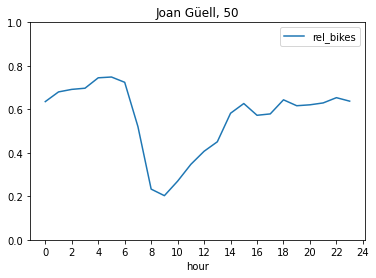

In [33]:
df_stations[df_stations['id']==192].groupby('hour').agg({'rel_bikes': np.mean}).plot(title='Joan Güell, 50',
                                                                                     yticks=[0, 0.2, 0.4, 0.6, 0.8, 1],
                                                                                     xticks=list(range(0, 25, 2)))

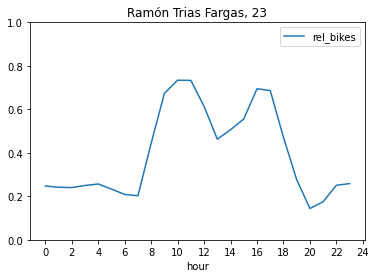

In [34]:
df_stations[df_stations['id']==47].groupby('hour').agg({'rel_bikes': np.mean}).plot(title='Ramón Trias Fargas, 23',
                                                                                     yticks=[0, 0.2, 0.4, 0.6, 0.8, 1],
                                                                                     xticks=list(range(0, 25, 2)))

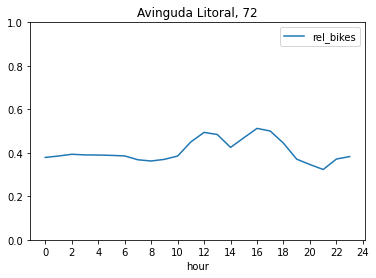

In [35]:
df_stations[df_stations['id']==190].groupby('hour').agg({'rel_bikes': np.mean}).plot(title='Avinguda Litoral, 72',
                                                                                     yticks=[0, 0.2, 0.4, 0.6, 0.8, 1],
                                                                                     xticks=list(range(0, 25, 2)))

# Station Clustering

## Data preprocessing

In [36]:
# Outlier identification idea: compute all bike changes and plot distributions.
# Assumption: bike changes should look like a normal distribution with a fat right-tail
# of changes made by workers which are larger than usual. Choose a cut-off point
# to differentiate between endogenous (users) and exogenous (workers) changes
# Create a new feature matrix to see 'real' mobility patterns and clusters

In [37]:
def bike_change_distribution(df, metric='bikes', filter=288):
  bike_changes = list()

  for node in df['id'].unique():
    node_data = df[(df['id']==node)&(df['dow']!=5)&(df['dow']!=6)][['day', metric, 'time']].reset_index(drop=True)
    idx_list = list()
    valid_days = list()
    for day in node_data['day'].unique():
      if len(node_data[node_data['day']==day]) >= filter:
        idx_list += node_data[node_data['day']==day].reset_index(drop=True).reset_index()['index'].tolist()
        valid_days.append(day)
    
    node_data = node_data.loc[node_data['day'].isin(valid_days)]
    node_data['idx'] = idx_list
    node_data = node_data.reset_index()
    
    for i in range(len(node_data)-1):
      change = abs(node_data.loc[i+1, metric] - node_data.loc[i, metric])
      bike_changes.append(change)

  fig = px.histogram(bike_changes)
  fig.show()
  return bike_changes

In [38]:
change_dist = bike_change_distribution(df_open)
change_dist_rel = bike_change_distribution(df_open, metric='rel_bikes')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Manual grid search shows cutoff=5 is best choice despite 0.99 = 4

In [39]:
q99 = round(len(change_dist)*0.991)
cut_point = sorted(change_dist)[q99]
cut_point

5

In [40]:
q99 = round(len(change_dist_rel)*0.991)
cut_point_rel = sorted(change_dist_rel)[q99]
cut_point_rel

0.19047619047619047

What data to use:
- Aggregate level data / Aggregate level data (PCA reduced)
- Aggregaate relative data / Aggregate relative data (PCA reduced)
- Delta level / Delta level (PCA reduced)
- Delta relative / Delta relative (PCA reduced)

The following function generates my feaure matrices for stations. Returns a NxT matrix (N stations, T (288) 5min frames where each cell contains the average number of bikes (or other metric) of station i at time t.

In [41]:
# Averages across time for each station.
# Result outputs a matrix with shape number_of_stations X time_intervals_in_a_day

def agg_avg(df, metric='bikes', weekend=False, filter=288):
  N = df['id'].nunique()
  T = 288
  out = np.empty([N, T])
  node_idx = 0
  sum = 0

  for node in df['id'].unique():
    if weekend:
      node_data = df[(df['id']==node)&(df['dow']!=0)&(df['dow']!=1)&(df['dow']!=2)&(df['dow']!=3)&(df['dow']!=4)][['day', metric, 'time']].reset_index(drop=True)
      idx_list = list()
    else:
      node_data = df[(df['id']==node)&(df['dow']!=5)&(df['dow']!=6)][['day', metric, 'time']].reset_index(drop=True)
      #node_data = df[df['id']==node][['day', metric, 'time']].reset_index(drop=True)
      idx_list = list()

    valid_days = list()
    for day in node_data['day'].unique():
      if len(node_data[node_data['day']==day]) >= filter:
        idx_list += node_data[node_data['day']==day].reset_index(drop=True).reset_index()['index'].tolist()
        valid_days.append(day)
    
    node_data = node_data.loc[node_data['day'].isin(valid_days)]
    node_data['idx'] = idx_list
    out[node_idx, :] = node_data.groupby('idx').agg({metric: np.mean})[metric].tolist()
    node_idx += 1
    sum += len(idx_list)

  len_df = len(df[(df['dow']!=5)&(df['dow']!=6)])
  print(f'{sum} rows of data where used, {round(sum/len_df, 2)*100}% of the dataset')
  return out

In [42]:
def agg_avg(df, metric='bikes', weekend=False, filter=288, cutoff=float('inf')):
  N = df['id'].nunique()
  T = 288
  out = np.empty([N, T])
  node_idx = 0
  sum = 0

  for node in df['id'].unique():
    if weekend:
      node_data = df[(df['id']==node)&(df['dow']!=0)&(df['dow']!=1)&(df['dow']!=2)&(df['dow']!=3)&(df['dow']!=4)][['day', metric, 'time']].reset_index(drop=True)
      idx_list = list()
    else:
      node_data = df[(df['id']==node)&(df['dow']!=5)&(df['dow']!=6)][['day', metric, 'time']].reset_index(drop=True)
      #node_data = df[df['id']==node][['day', metric, 'time']].reset_index(drop=True)
      idx_list = list()

    valid_days = list()
    for day in node_data['day'].unique():
      if len(node_data[node_data['day']==day]) >= filter:
        idx_list += node_data[node_data['day']==day].reset_index(drop=True).reset_index()['index'].tolist()
        valid_days.append(day)
    
    node_data = node_data.loc[node_data['day'].isin(valid_days)]
    node_data['idx'] = idx_list
    node_data = node_data.reset_index(drop=True)
    for i in range(len(node_data)):
      if i != 0 and abs(node_data.loc[i, metric] - node_data.loc[i-1, metric]) > cutoff:
        node_data.loc[i, metric] = node_data.loc[i-1, metric]
    out[node_idx, :] = node_data.groupby('idx').agg({metric: np.mean})[metric].tolist()
    node_idx += 1
    sum += len(idx_list)

  len_df = len(df[(df['dow']!=5)&(df['dow']!=6)])
  print(f'{sum} rows of data where used, {round(sum/len_df, 2)*100}% of the dataset')
  return out

Filter = 288 means using data only for days with full data for that node

In [43]:
agg_data_level = agg_avg(df_open)
agg_data_level_q99 = agg_avg(df_open, cutoff=cut_point)
agg_data_rel = agg_avg(df_open, metric='rel_bikes')
agg_data_rel_q99 = agg_avg(df_open, metric='rel_bikes', cutoff=cut_point_rel)

1185408 rows of data where used, 63.0% of the dataset
1185408 rows of data where used, 63.0% of the dataset
1185408 rows of data where used, 63.0% of the dataset
1185408 rows of data where used, 63.0% of the dataset


In [44]:
def delta_data(data, absolute=True):

  output = np.empty([data.shape[0], data.shape[1]-1])

  for i in range(2, data.shape[1]):
    if absolute:
        delta_t = abs(data[:, i] - data[:, i-1])
    else:
        ##
        delta_t = data[:, i] - data[:, i-1]
    output[:, i-1] = delta_t

  return output

In [45]:
delta_level = delta_data(agg_data_level)
delta_level_q99 = delta_data(agg_data_level_q99)
delta_rel = delta_data(agg_data_rel)
delta_rel_q99 = delta_data(agg_data_rel_q99)
delta_level_noabs = delta_data(agg_data_level, absolute=False)  ##

In [46]:
from sklearn.decomposition import PCA

In [47]:
pca = PCA(n_components=0.99)

In [48]:
level_reduced = pca.fit_transform(agg_data_level)
print(agg_data_level.shape)
print(level_reduced.shape)

(459, 288)
(459, 17)


In [49]:
rel_reduced = pca.fit_transform(agg_data_rel)
print(agg_data_rel.shape)
print(rel_reduced.shape)

(459, 288)
(459, 19)


In [50]:
delta_level_reduced = pca.fit_transform(delta_level)
print(delta_level.shape)
print(delta_level_reduced.shape)

(459, 287)
(459, 232)


In [51]:
delta_rel_reduced = pca.fit_transform(delta_rel)
print(delta_rel.shape)
print(delta_rel_reduced.shape)

(459, 287)
(459, 236)


In [52]:
# This block of code has been taken from: https://sushildeore99.medium.com/really-what-is-hopkins-statistic-bad1265df4b
from sklearn.neighbors import NearestNeighbors
from random import sample, seed
from numpy.random import uniform
from math import isnan

def hopkins(X):
  d = X.shape[1]
  #d = len(vars) # columns
  n = len(X) # rows
  m = int(0.1 * n)
  seed(123)
  nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
  rand_X = sample(range(0, n, 1), m)
 
  ujd = []
  wjd = []
  for j in range(0, m):
     u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
     ujd.append(u_dist[0][1])
     w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
     wjd.append(w_dist[0][1])
 
  H = sum(ujd) / (sum(ujd) + sum(wjd))
  if isnan(H):
     print(ujd, wjd)
     H = 0
 
  return H

In [53]:
data_features = [
    delta_level_noabs,
    agg_data_level_q99,
    agg_data_level, 
    agg_data_rel,
    agg_data_rel_q99, 
    level_reduced, 
    rel_reduced, 
    delta_level,
    delta_level_q99, 
    delta_rel,
    delta_rel_q99,
    delta_level_reduced, 
    delta_rel_reduced
]
for data in data_features:
  temp = pd.DataFrame(data=data, columns=list(range(data.shape[1])))
  hstat = hopkins(temp)
  print(f'Hopkins Statistic: {round(hstat, 4)}')

Hopkins Statistic: 0.7758
Hopkins Statistic: 0.8695
Hopkins Statistic: 0.8029
Hopkins Statistic: 0.7652
Hopkins Statistic: 0.8432
Hopkins Statistic: 0.7214
Hopkins Statistic: 0.7079
Hopkins Statistic: 0.7937
Hopkins Statistic: 0.7201
Hopkins Statistic: 0.7836
Hopkins Statistic: 0.7209
Hopkins Statistic: 0.6876
Hopkins Statistic: 0.6816


## KMeans

In [54]:
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, ward_tree
from sklearn.metrics import silhouette_score

In [55]:
def experiment(data, n=10, max_k=10):

  def kmeans_elbow(node_features, max_k=max_k, sil_metric='euclidean'):
    sil_scores = list()
    wcss_list = list()

    for i in range(2, max_k+1):
      kmeans = KMeans(n_clusters=i)
      cluster_pred = kmeans.fit_predict(node_features)
      wcss_list.append(kmeans.inertia_)
      sil_scores.append(silhouette_score(node_features, cluster_pred, metric=sil_metric))

    return wcss_list, sil_scores


  results_sil = np.empty([len(data), max_k-1])
  results_wcss = np.empty([len(data), max_k-1])
  idx = 0
  for dataset in data:
    sil_scores = np.empty([n, max_k-1])
    wcss_scores = np.empty([n, max_k-1])
    for i in range(n):
      wcss, silhouette = kmeans_elbow(dataset)
      sil_scores[i] = silhouette
      wcss_scores[i] = wcss
      
    results_sil[idx] = np.round(np.mean(sil_scores, axis=0), 4)
    results_wcss[idx] = np.round(np.mean(wcss_scores, axis=0), 4)
    idx += 1

  results_sil = results_sil.tolist()
  results_wcss = results_wcss.tolist()
  datasets = ['level_data', 'level_data_q99', 'relative_data', 'relative_data_q99',
              'level_delta', 'level_delta_q99', 'relative_delta', 'relative_delta_q99']
  
  results_sil = [[ds] + row for ds, row in zip(datasets, results_sil)]
  results_wcss = [[ds] + row for ds, row in zip(datasets, results_wcss)]
  columns = list(range(2, 11))
  columns.insert(0, 'datasets')
  temp_sil = pd.DataFrame(data=results_sil,
                      columns=columns).set_index('datasets').transpose()
  temp_wcss = pd.DataFrame(data=results_wcss,
                      columns=columns).set_index('datasets').transpose()
  fig_wcss = px.line(temp_wcss, title='Within-Cluster Sum of Squares')
  fig_sil = px.line(temp_sil, title='Silhouette Score')
  fig_wcss.show()
  fig_sil.show()

In [56]:
experiment_data = [agg_data_level, agg_data_level_q99, agg_data_rel, agg_data_rel_q99, delta_level, delta_level_q99, delta_rel, delta_rel_q99]
experiment(experiment_data)

In [57]:
lat = df_open.groupby('id').agg({'latitude': 'min',
                                 'longitude': 'min'})['latitude'].tolist()
lon = df_open.groupby('id').agg({'latitude': 'min',
                                 'longitude': 'min'})['longitude'].tolist()

Runs kmeans and colors stations according to cluster group

In [58]:
k = 3
feature_matrix = agg_data_level
kmeans = KMeans(n_clusters=k, random_state=12)
preds = kmeans.fit_predict(feature_matrix)
df_preds = pd.DataFrame({'lat': lat, 'lon': lon, 'preds': preds, 'id': df_open['id'].unique()})
fig = px.scatter_mapbox(df_preds, lat='lat', lon='lon', color='preds', hover_data=['id'], zoom=11)
fig.show()

In [59]:
df_preds['id'].count()

459

In [60]:
df_preds.groupby('preds').count()['id']

preds
0    125
1    172
2    162
Name: id, dtype: int64

In [61]:
def plot_cluster_trends(data, preds, metric='mean', granularity='hour'):
  temp = pd.DataFrame({'bikes': data.flatten(),
                       'time': np.asarray([df_open[df_open['day']==31]['updateTime'].unique()]*459).flatten(),
                       'cluster': np.asarray([preds]*288).flatten()})
  temp['hour'] = temp['time'].dt.hour
  temp2 = temp.groupby(['cluster', granularity]).agg({'bikes': metric}).reset_index()
  fig = px.line(temp2, x=granularity, y='bikes', color='cluster')
  fig.show()

Plots average bike for each cluster, metric=median/mean, granularity=time/hour

In [62]:
plot_cluster_trends(feature_matrix, df_preds['preds'])

In [63]:
def plot_cluster_diff(data, preds, metric='mean', granularity='hour', metric2='bikes'):
  temp = pd.DataFrame({metric2: data.flatten(),
                       'time': np.asarray([df_open[df_open['day']==31]['updateTime'].unique()]*459).flatten(),
                       'cluster': np.asarray([preds]*288).flatten()})
  temp['hour'] = temp['time'].dt.hour
  temp2 = temp.groupby(['cluster', granularity]).agg({metric2: metric}).reset_index()
  temp_total = temp.groupby([granularity]).agg({metric2: metric}).reset_index()
  temp2 = temp2.join(temp_total, on=granularity, rsuffix='_avg')
  temp2['bikes_diff'] = temp2[metric2] - temp2[metric2+'_avg']
  fig = px.line(temp2, x=granularity, y='bikes_diff', color='cluster')
  fig.show()

In [64]:
plot_cluster_diff(feature_matrix, df_preds['preds'])

In [65]:
k = 4
feature_matrix = agg_data_level_q99
kmeans = KMeans(n_clusters=k, random_state=12)
preds = kmeans.fit_predict(feature_matrix)
df_preds = pd.DataFrame({'lat': lat, 'lon': lon, 'preds': preds, 'id': df_open['id'].unique()})
fig = px.scatter_mapbox(df_preds, lat='lat', lon='lon', color='preds', hover_data=['id'], zoom=11)
fig.show()

In [66]:
df_preds.groupby('preds').count()['id']

preds
0    189
1     81
2     91
3     98
Name: id, dtype: int64

In [67]:
plot_cluster_trends(feature_matrix, df_preds['preds'])

In [68]:
plot_cluster_diff(feature_matrix, df_preds['preds'])

## Affinity Propagation

In [69]:
from sklearn.cluster import AffinityPropagation
for damping in [0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.99]:
    clf = AffinityPropagation(damping=damping)
    clf.fit(feature_matrix)
    print(f'Damping param: {damping}, n_clusters: {len(clf.cluster_centers_indices_)}')

Damping param: 0.5, n_clusters: 17
Damping param: 0.6, n_clusters: 16
Damping param: 0.7, n_clusters: 16
Damping param: 0.8, n_clusters: 15
Damping param: 0.9, n_clusters: 15
Damping param: 0.95, n_clusters: 1
Damping param: 0.99, n_clusters: 1


In [70]:
af = AffinityPropagation(damping=0.7)
preds = af.fit_predict(feature_matrix)
df_af = pd.DataFrame({'lat': lat, 'lon': lon, 'preds': preds, 'id': df_open['id'].unique()})
fig = px.scatter_mapbox(df_af, lat='lat', lon='lon', color='preds', hover_data=['id'], zoom=11)
fig.show()

In [71]:
plot_cluster_trends(feature_matrix, df_af['preds'])

In [72]:
from scipy.stats import chi2_contingency
  
# defining the table
data = [df_preds['preds'].to_list(), df_af['preds'].to_list()]
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.01
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 2.6716896791693975e-29
Dependent (reject H0)


## Hierarchical Clustering

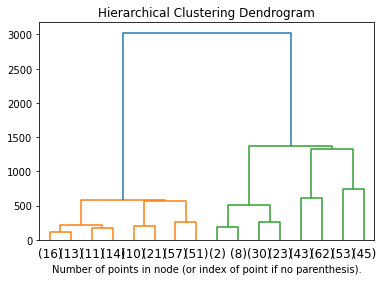

In [73]:
# Code cell borrowed from https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(feature_matrix)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [74]:
hcluster = AgglomerativeClustering(n_clusters=4, compute_distances=True)
preds = hcluster.fit_predict(feature_matrix)
df_hcluster = pd.DataFrame({'lat': lat, 'lon': lon, 'preds': preds, 'id': df_open['id'].unique()})
fig = px.scatter_mapbox(df_hcluster, lat='lat', lon='lon', color='preds', hover_data=['id'], zoom=11)
fig.show()

In [75]:
plot_cluster_trends(feature_matrix, df_hcluster['preds'])

Hierarchical clustering also produces similar patterns

In [76]:
n_differences = 0
cluster_dict = {0: 3, 1: 2, 2: 1, 3: 0}

for pred1, pred2 in zip(df_preds['preds'], df_hcluster['preds']):
  if pred1 != cluster_dict[pred2]:
    n_differences += 1
print(f'''Hierarchical clustering and k-means classified {n_differences} stations differently.
This is, around {round(n_differences/len(df_preds), 2)*100}% of the total number of predictions.''')

Hierarchical clustering and k-means classified 35 stations differently.
This is, around 8.0% of the total number of predictions.


# Station Prediction

# Last Value

In [77]:
def last_value(df, pred_window):

  abs_error = list()
  true_full_empty = 0
  pred_full_empty = 0 

  for node in df['id'].unique():
    capacity = np.asarray(df[df['id']==node].sort_values('updateTime')['capacity'].tolist())[0]
    bikes_array = np.asarray(df[df['id']==node].sort_values('updateTime')['bikes'].tolist())

    for i in range(pred_window, len(bikes_array)-pred_window):
      last_value = bikes_array[i-pred_window]
      error = abs(last_value - bikes_array[i])
      abs_error.append(error)

      if bikes_array[i] == 0:
        true_full_empty += 1
        if math.isclose(last_value, 0, abs_tol=0.5):
          pred_full_empty += 1
      if bikes_array[i] == capacity:
        true_full_empty += 1
        if math.isclose(last_value, capacity, abs_tol=0.5):
          pred_full_empty += 1

  mae = sum(abs_error)/len(abs_error)
  full_empty_acc = round(pred_full_empty / true_full_empty, 2)
  
  return mae, full_empty_acc

# Rolling Mean

In [78]:
def rolling_mean(df, pred_window):

  abs_error = list()
  true_full_empty = 0
  pred_full_empty = 0 

  for node in df['id'].unique():
    capacity = np.asarray(df[df['id']==node].sort_values('updateTime')['capacity'].tolist())[0]
    bikes_array = np.asarray(df[df['id']==node].sort_values('updateTime')['bikes'].tolist())

    for i in range(pred_window, len(bikes_array)-pred_window):
      pred = np.mean(bikes_array[i-pred_window:i])
      error = abs(pred - bikes_array[i])
      abs_error.append(error)

      if bikes_array[i] == 0:
        true_full_empty += 1
        if math.isclose(pred, 0, abs_tol=0.5):
          pred_full_empty += 1
      if bikes_array[i] == capacity:
        true_full_empty += 1
        if math.isclose(pred, capacity, abs_tol=0.5):
          pred_full_empty += 1

  mae = sum(abs_error)/len(abs_error)
  full_empty_acc = round(pred_full_empty / true_full_empty, 2)

  return mae, full_empty_acc

# Historical Mean

In [79]:
def historic_mean(df, pred_window):

  abs_error = list()
  true_full_empty = 0
  pred_full_empty = 0 

  for node in df['id'].unique():
    capacity = np.asarray(df[df['id']==node].sort_values('updateTime')['capacity'].tolist())[0]
    bikes_array = np.asarray(df[df['id']==node].sort_values('updateTime')['bikes'].tolist())
    times_array = np.asarray(df[df['id']==node].sort_values('updateTime')['time'].tolist())
    preds = df[df['id']==node].groupby('time').agg({'bikes': 'mean'}).reset_index()

    for i in range(pred_window, len(bikes_array)//4):
      time = times_array[i-pred_window]
      pred = preds[preds['time']==time].reset_index(drop=True).loc[0, 'bikes']
      error = abs(pred - bikes_array[i])
      abs_error.append(error)

      if bikes_array[i] == 0:
        true_full_empty += 1
        if math.isclose(pred, 0, abs_tol=0.5):
          pred_full_empty += 1
      if bikes_array[i] == capacity:
        true_full_empty += 1
        if math.isclose(pred, capacity, abs_tol=0.5):
          pred_full_empty += 1

  mae = sum(abs_error)/len(abs_error)
  full_empty_acc = round(pred_full_empty / true_full_empty, 2)

  return mae, full_empty_acc

# Prediction Experiment

In [ ]:
mae_hist_lv = list()
mae_hist_rm = list()
mae_hist_hm = list()
full_empty_lv = list()
full_empty_rm = list()
full_empty_hm = list()
max_window = 25 # aka 2h

for i in range(1, max_window):
  mae_lv, fe_lv = last_value(df_open, pred_window=i)
  mae_hist_lv.append(mae_lv)
  full_empty_lv.append(fe_lv)
  mae_rm, fe_rm = rolling_mean(df_open, pred_window=i)
  mae_hist_rm.append(mae_rm)
  full_empty_rm.append(fe_rm)
  mae_hm, fe_hm = historic_mean(df_open, pred_window=i)
  mae_hist_hm.append(mae_hm)
  full_empty_hm.append(fe_hm)
  print(f'Finished prediction window {i}')

data_mae = [list(range(1, max_window)), mae_hist_lv, mae_hist_rm, mae_hist_hm]
data_fe = [list(range(1, max_window)), full_empty_lv, full_empty_rm, full_empty_hm]

Finished prediction window 1
Finished prediction window 2
Finished prediction window 3
Finished prediction window 4
Finished prediction window 5
Finished prediction window 6
Finished prediction window 7


In [ ]:
df_fig = pd.DataFrame(data=np.asarray(data_mae).transpose(), columns=['Prediction Window (1 = 5min)', 'Last Value MAE', 'Rolling Mean MAE', 'Historic Mean MAE'])
fig = px.line(df_fig, x='Prediction Window (1 = 5min)', y=df_fig.columns[1:])
fig.show()

In [ ]:
df_fig = pd.DataFrame(data=np.asarray(data_fe).transpose(), columns=['Prediction Window (1 = 5min)', 'LV full-empty accuracy', 'RM full-empty accuracy', 'HM full-empty accuracy'])
fig = px.line(df_fig, x='Prediction Window (1 = 5min)', y=df_fig.columns[1:])
fig.show()